# Quem ama cuida
### <i>E quem cuida precisa saber como</i>

<br>
 Diante dessa crise mundial de saúde, que afetou diversas áreas da nossa vida, muitos planos tiveram que ser revistos. Agendas tiveram que ser alteradas. Atividades tiveram que ser readaptadas. Entre essas alterações está a nossa PS, que foi configurada de um modo bastante pertinente ao que estamos vivendo.

 Nós fomos desafiados a desenvolver uma solução que garanta o bem estar dos <b>idosos que moram sozinhos</b>, especialmente durante o período de <i><u>quarentena</u></i>. Essa proposta é excelente e deixou o nosso grupo muito animado. Muito mais do que uma avaliação, nós enxergamos a oportunidade de criar algo realmente relevante para a saúde mental e emocional dos idosos.
 
 Tivemos várias ideias, pensamos numa infinidade de coisas que poderiam ser feitas, e decidimos criar um projeto voltado para hobbies.
 
 <i>Talvez você pense: "QUÊ!? Isso é mesmo relevante?"</i>
 
 Hobbies para idosos certamente não é a primeira coisa que vem à cabeça quando se fala em garantir o bem estar dos nossos amados velhinhos, mas temos boas razões para crer que esse "ponto fraco" é na verdade um dos pontos fortes do nosso projeto. 
 
 Pois já existem incontáveis soluções para serviços básicos como saúde e alimentação. Qualquer coisa a ser produzida nessas áreas, provavelmente será <b><i>mais do mesmo</i></b>.
 
 Por outro lado, nós constatamos em nossas pesquisas que não existem muitas soluções relevantes para o nicho de hobbies. E constatamos também que os <i>benefícios físicos, mentais e emocionais</i> de um hobby são maiores do que podemos imaginar. Assim sendo, decidimos explorar essa área.

 Desenvolvemos um aplicativo que contém alguns hobbies pré definidos <i>(como jardinagem, crochê e meditação)</i>, com a possibilidade do usuário criar novos hobbies dentro do app. Nossa ideia foi desenvolver um <u>ambiente em que o idoso pudesse obter informações úteis</u> sobre o seu hobby, bem como interagir com outros praticantes do mesmo hobby.

## IA & Machine Learning

 Para otimizar a nossa aplicação, nós decidimos - <i>com toda a nossa experiência de seis meses como alunos de IA</i> - usar a inteligência artificial para implementar um sistema de reconhecimento de flores. Esse recurso é muito relevante, pois cada espécie necessita de cuidados específicos.
 
 Funcionaria assim: o usuário encaminharia a foto de uma flor para o nosso app, a foto seria comparada com as imagens do nosso acervo e, após a identificação, a app retornaria o nome da flor, o intervalo ideal para regá-la e a temperatura mais adequada para ela.
 
 Com essas informações, o usuário saberá exatamente os cuidados que precisa ter com cada flor. As flores, agora bem cuidadas, certamente ficarão mais bonitas. E isso aumentará muito a auto-estima do idoso.

 Estamos estudando as possibilidades e a melhor forma de implementar isso. Um dos fatores que vimos ser necessário é um dataset que contenha as imagens das flores, para podermos fazer as comparações. O dataset que usamos é o <a href= "https://www.kaggle.com/msheriey/104-flowers-garden-of-eden">104 Flowers: Garden of Eden </a>.
 
 Vamos dar uma olhadinha nele. . .

### Lendo os arquivos

Para ler os arquivos da nossa base de dados, precisamos importar algumas bibliotecas, acessar o endereço em que eles estão armazenados e retornar de forma organizada. . .

In [1]:
import os
import random
import numpy as np
import matplotlib.pyplot as plt

from PIL import Image

In [2]:
DATASET_DIR = '../data/jpeg-512x512'
TRAIN_DIR  = '../data/jpeg-512x512/train'

In [3]:
FLOWER_NAMES = []

FLOWER_TRAIN_FILEPATHS = {}

for root, dir_names, _ in os.walk(TRAIN_DIR):
    
    for dir_name in dir_names:
        FLOWER_NAMES.append(dir_name)
        FLOWER_TRAIN_FILEPATHS[dir_name] = []
        
        for dir_root, _, dir_filenames in os.walk(os.path.join(root, dir_name)):            
            
            for filename in dir_filenames: 
                FLOWER_TRAIN_FILEPATHS[dir_name].append(os.path.join(dir_root, filename))

### Nomes das Flores

Agora nós podemos ver os nomes das flores do dataset, mas antes vamos dar uma olhada na quantidade que temos:

In [4]:
print('len(FLOWER_NAMES): ', len(FLOWER_NAMES))

len(FLOWER_NAMES):  10


Temos 10 flores na base. Originalmente, o dataset contém 104 flores, com diversas imagens cada. Isso faz com que seu tamanho seja muito grande. Como o propósito deste notebook é apenas mostrar a nossa ideia, nós deixamos apenas algumas flores na nossa base, para servir de exemplo.

Agora sim, vamos ver em lista os nomes das flores que temos:

In [5]:
FLOWER_NAMES

['balloon flower',
 'camellia',
 'bird of paradise',
 'trumpet creeper',
 'azalea',
 'yellow iris',
 'bee balm',
 'blackberry lily',
 'lotus',
 'magnolia']

### Navegação

Também podemos entrar em cada flor e ver os arquivos jpeg que estão lá dentro. Por exemplo, se quisermos saber quais arquivos estão na <b>MAGNOLIA</b>:

In [6]:
FLOWER_TRAIN_FILEPATHS['magnolia']

['../data/jpeg-512x512/train/magnolia/4384.jpeg',
 '../data/jpeg-512x512/train/magnolia/4862.jpeg',
 '../data/jpeg-512x512/train/magnolia/8891.jpeg',
 '../data/jpeg-512x512/train/magnolia/11314.jpeg',
 '../data/jpeg-512x512/train/magnolia/10076.jpeg',
 '../data/jpeg-512x512/train/magnolia/9434.jpeg',
 '../data/jpeg-512x512/train/magnolia/11551.jpeg',
 '../data/jpeg-512x512/train/magnolia/11645.jpeg',
 '../data/jpeg-512x512/train/magnolia/12211.jpeg',
 '../data/jpeg-512x512/train/magnolia/7269.jpeg',
 '../data/jpeg-512x512/train/magnolia/4616.jpeg',
 '../data/jpeg-512x512/train/magnolia/9203.jpeg',
 '../data/jpeg-512x512/train/magnolia/5168.jpeg',
 '../data/jpeg-512x512/train/magnolia/10344.jpeg',
 '../data/jpeg-512x512/train/magnolia/8722.jpeg',
 '../data/jpeg-512x512/train/magnolia/11268.jpeg',
 '../data/jpeg-512x512/train/magnolia/1927.jpeg',
 '../data/jpeg-512x512/train/magnolia/10418.jpeg',
 '../data/jpeg-512x512/train/magnolia/11424.jpeg',
 '../data/jpeg-512x512/train/magnolia/928

Ou se quisermos saber quais arquivos estão em <b>CAMELLIA</b>:

In [7]:
FLOWER_TRAIN_FILEPATHS['camellia']

['../data/jpeg-512x512/train/camellia/8395.jpeg',
 '../data/jpeg-512x512/train/camellia/9879.jpeg',
 '../data/jpeg-512x512/train/camellia/581.jpeg',
 '../data/jpeg-512x512/train/camellia/1665.jpeg',
 '../data/jpeg-512x512/train/camellia/5380.jpeg',
 '../data/jpeg-512x512/train/camellia/5840.jpeg',
 '../data/jpeg-512x512/train/camellia/9267.jpeg',
 '../data/jpeg-512x512/train/camellia/5649.jpeg',
 '../data/jpeg-512x512/train/camellia/12414.jpeg',
 '../data/jpeg-512x512/train/camellia/12372.jpeg',
 '../data/jpeg-512x512/train/camellia/6896.jpeg',
 '../data/jpeg-512x512/train/camellia/4537.jpeg',
 '../data/jpeg-512x512/train/camellia/3896.jpeg',
 '../data/jpeg-512x512/train/camellia/7561.jpeg',
 '../data/jpeg-512x512/train/camellia/5061.jpeg',
 '../data/jpeg-512x512/train/camellia/2121.jpeg',
 '../data/jpeg-512x512/train/camellia/6321.jpeg',
 '../data/jpeg-512x512/train/camellia/6809.jpeg',
 '../data/jpeg-512x512/train/camellia/6061.jpeg',
 '../data/jpeg-512x512/train/camellia/7303.jpeg',

### Foto das Flores

Finalmente, vamos dar uma olhada nas imagens em si. . .

In [8]:
def grow_flowers(flower_type, sample_size=5):
    flowers = [Image.open(flower).convert('RGB') for flower in random.sample(FLOWER_TRAIN_FILEPATHS[flower_type], sample_size)]
                
    n_flowers = len(flowers)
    
    figure = plt.figure()
    for i, flower in enumerate(flowers):
        figure.add_subplot(1, np.ceil(n_flowers), i + 1)
        plt.axis('off')
        plt.imshow(flower)
        
    figure.set_size_inches(np.array(figure.get_size_inches()) * n_flowers)
    
    plt.show()

balloon flower


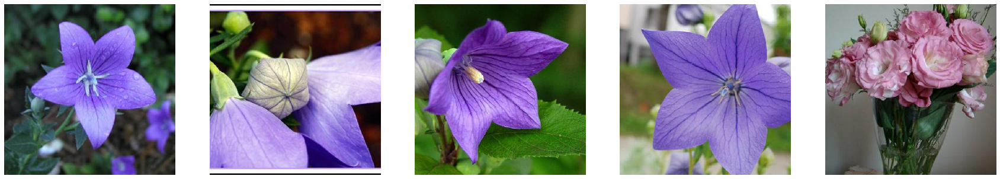

camellia


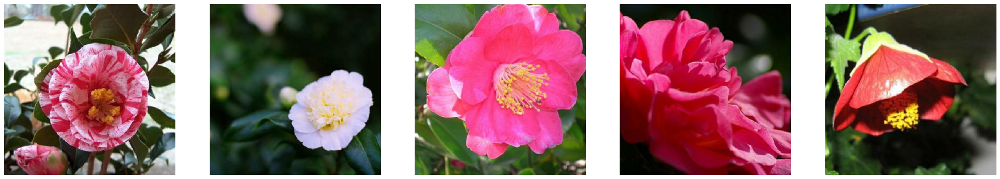

bird of paradise


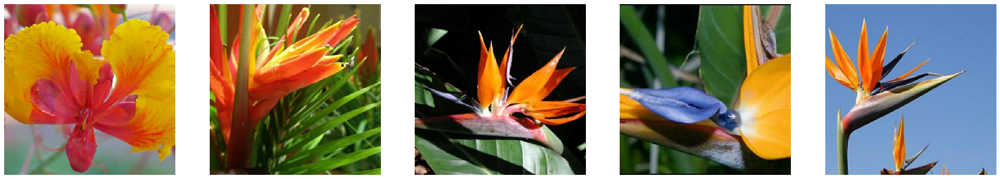

trumpet creeper


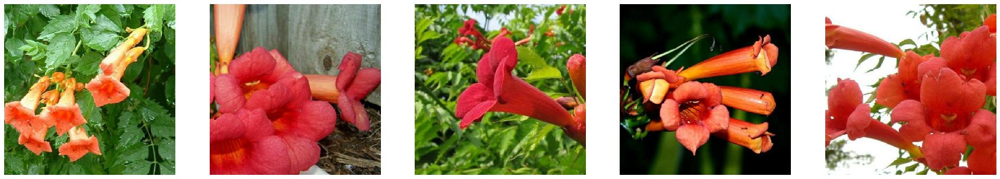

azalea


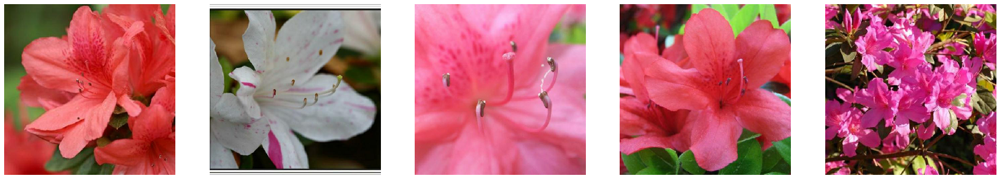

yellow iris


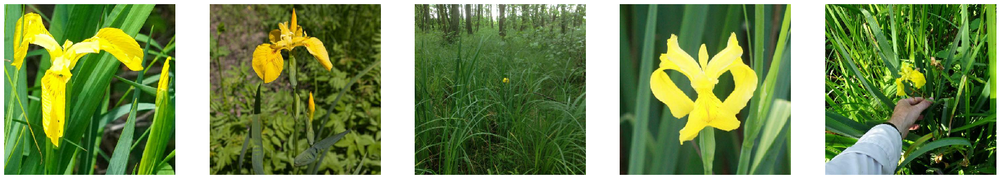

bee balm


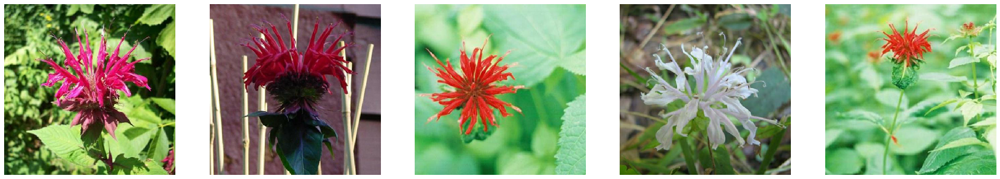

blackberry lily


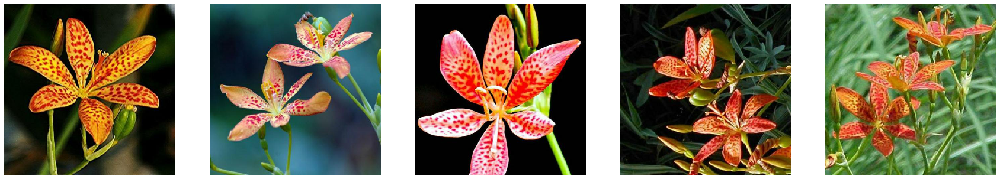

lotus


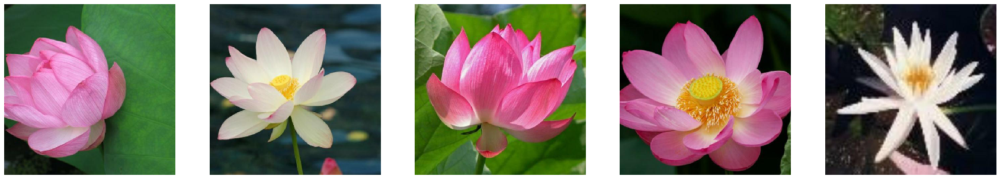

magnolia


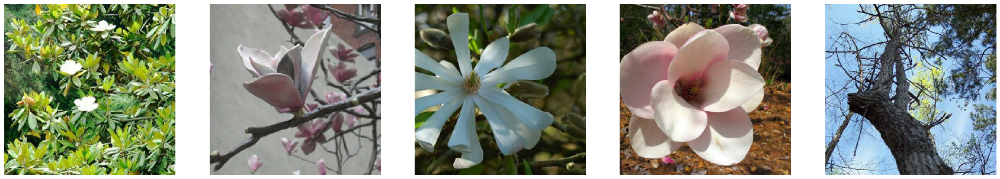

In [9]:
for flower_name in FLOWER_NAMES:
    print(flower_name)
    grow_flowers(flower_name)

 Agora que temos o nosso dataset preparado, podemos pensar em como desenvolver o reconhecimento das flores.